# **Connect to Kaggle to get the Dataset**

In [1]:
! pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mhammadibrahim","key":"5ff65ca8625e3a7631f9b772d5cd8b3a"}'}

In [3]:
! mkdir ~/.kaggle

In [4]:
! cp kaggle.json ~/.kaggle/


In [5]:
! chmod 600 ~/.kaggle/kaggle.json

# **Import Libraries**

In [6]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# **Get Dataset from Kaggle**

In [7]:
!kaggle datasets download -d vatsalmavani/spotify-dataset

 79% 13.0M/16.5M [00:00<00:00, 60.7MB/s]
100% 16.5M/16.5M [00:00<00:00, 66.5MB/s]


# **Unzip Dataset**

In [8]:
!unzip spotify-dataset.zip

Archive:  spotify-dataset.zip
  inflating: data/data.csv           
  inflating: data/data_by_artist.csv  
  inflating: data/data_by_genres.csv  
  inflating: data/data_by_year.csv   
  inflating: data/data_w_genres.csv  


# **Read the Dataset**

In [9]:
data = pd.read_csv("/content/data/data.csv")
genre_data = pd.read_csv('/content/data/data_by_genres.csv')
year_data = pd.read_csv('/content/data/data_by_year.csv')

In [10]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [11]:
data.corr()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
valence,1.000000,-0.028245,-0.184101,0.558946,-0.191813,0.353876,-0.018613,-0.198501,0.028473,0.003832,0.313512,0.015641,0.014200,0.046381,0.171689
year,-0.028245,1.000000,-0.614250,0.188515,0.079713,0.530272,0.220881,-0.272371,0.007540,-0.057318,0.487697,-0.032385,0.862442,-0.167816,0.141048
acousticness,-0.184101,-0.614250,1.000000,-0.266852,-0.076373,-0.749393,-0.246007,0.329819,-0.020550,-0.024482,-0.561696,0.047168,-0.573162,-0.043980,-0.207120
danceability,0.558946,0.188515,-0.266852,1.000000,-0.139937,0.221967,0.241757,-0.278063,0.024439,-0.100193,0.285057,-0.045956,0.199606,0.235491,0.001801
duration_ms,-0.191813,0.079713,-0.076373,-0.139937,1.000000,0.042119,-0.048880,0.084770,-0.004266,0.047168,-0.003037,-0.046085,0.059597,-0.084604,-0.025472
energy,0.353876,0.530272,-0.749393,0.221967,0.042119,1.000000,0.132723,-0.281101,0.027705,0.126192,0.782362,-0.039260,0.485005,-0.070555,0.250865
explicit,-0.018613,0.220881,-0.246007,0.241757,-0.048880,0.132723,1.000000,-0.140987,0.005432,0.039640,0.140300,-0.078872,0.191543,0.414070,0.011969
instrumentalness,-0.198501,-0.272371,0.329819,-0.278063,0.084770,-0.281101,-0.140987,1.000000,-0.014591,-0.047193,-0.408611,-0.036543,-0.296750,-0.121700,-0.105361
key,0.028473,0.007540,-0.020550,0.024439,-0.004266,0.027705,0.005432,-0.014591,1.000000,0.000205,0.017385,-0.116260,0.007826,0.023784,0.002629
liveness,0.003832,-0.057318,-0.024482,-0.100193,0.047168,0.126192,0.039640,-0.047193,0.000205,1.000000,0.056422,0.002641,-0.076464,0.134667,0.007714


# **Preprocessing Data**

In [12]:
data = data.drop(columns=['id'],axis=1)
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [13]:
print(data['artists'].head())
print(data['name'].head())

0    ['Sergei Rachmaninoff', 'James Levine', 'Berli...
1                                       ['Dennis Day']
2    ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...
3                                     ['Frank Parker']
4                                       ['Phil Regan']
Name: artists, dtype: object
0    Piano Concerto No. 3 in D Minor, Op. 30: III. ...
1                              Clancy Lowered the Boom
2                                            Gati Bali
3                                            Danny Boy
4                          When Irish Eyes Are Smiling
Name: name, dtype: object


In [14]:
# from sklearn.preprocessing import LabelEncoder
# # Encoding categorical variables
# le = LabelEncoder()
# data['artists_encoded'] = le.fit_transform(data['artists'])
# data['name_encoded'] = le.fit_transform(data['name'])

# # Drop the original categorical columns
# data = data.drop(['artists', 'name'], axis=1)

In [15]:
# Normalizing numerical variables
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data[['loudness', 'tempo','duration_ms','popularity','key']] = scaler.fit_transform(data[['loudness', 'tempo','duration_ms','popularity','key']])

# Handling datetime variables
data['release_date'] = pd.to_datetime(data['release_date'])
data['year'] = data['release_date'].dt.year
data['month'] = data['release_date'].dt.month
data['day_of_week'] = data['release_date'].dt.dayofweek

data.head()


,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,month,day_of_week
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,0.153112,0.211,0,0.878000,0.909091,0.665,0.624916,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",0.04,1921-01-01,0.0366,0.332450,1,5
1,0.9630,1921,0.732,['Dennis Day'],0.819,0.032496,0.341,0,0.000000,0.636364,0.160,0.744797,1,Clancy Lowered the Boom,0.05,1921-01-01,0.4150,0.250243,1,5
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,0.091685,0.166,0,0.913000,0.272727,0.101,0.707071,1,Gati Bali,0.05,1921-01-01,0.0339,0.453125,1,5
3,0.1650,1921,0.967,['Frank Parker'],0.275,0.037954,0.309,0,0.000028,0.454545,0.381,0.793736,1,Danny Boy,0.03,1921-01-01,0.0354,0.411113,1,5
4,0.2530,1921,0.957,['Phil Regan'],0.418,0.029932,0.193,0,0.000002,0.272727,0.229,0.781521,1,When Irish Eyes Are Smiling,0.02,1921-01-01,0.0380,0.417503,1,5


In [16]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   valence           170653 non-null  float64       
 1   year              170653 non-null  int64         
 2   acousticness      170653 non-null  float64       
 3   artists           170653 non-null  object        
 4   danceability      170653 non-null  float64       
 5   duration_ms       170653 non-null  float64       
 6   energy            170653 non-null  float64       
 7   explicit          170653 non-null  int64         
 8   instrumentalness  170653 non-null  float64       
 9   key               170653 non-null  float64       
 10  liveness          170653 non-null  float64       
 11  loudness          170653 non-null  float64       
 12  mode              170653 non-null  int64         
 13  name              170653 non-null  object        
 14  popu

In [17]:
genre_data.corr()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
mode,1.000000,0.077347,-0.071240,-0.053197,-0.080352,-0.012662,-0.002650,-0.063706,-0.059127,-0.042931,-0.010258,-0.031231,-0.060109
acousticness,0.077347,1.000000,-0.324991,-0.014075,-0.868274,0.273739,-0.076570,-0.737276,-0.086139,-0.397713,-0.178210,-0.458698,-0.078815
danceability,-0.071240,-0.324991,1.000000,-0.160634,0.299780,-0.383102,-0.055147,0.453062,0.242052,0.082869,0.652546,0.217992,0.029551
duration_ms,-0.053197,-0.014075,-0.160634,1.000000,-0.048158,0.229421,0.018624,-0.137574,0.033226,-0.046840,-0.257517,-0.071019,-0.029309
energy,-0.080352,-0.868274,0.299780,-0.048158,1.000000,-0.324940,0.168233,0.848965,0.119791,0.430825,0.305166,0.337795,0.097165
instrumentalness,-0.012662,0.273739,-0.383102,0.229421,-0.324940,1.000000,-0.050615,-0.537669,-0.196763,-0.201663,-0.424091,-0.265449,-0.069317
liveness,-0.002650,-0.076570,-0.055147,0.018624,0.168233,-0.050615,1.000000,0.123946,0.190136,0.002285,0.000730,-0.094178,0.007308
loudness,-0.063706,-0.737276,0.453062,-0.137574,0.848965,-0.537669,0.123946,1.000000,0.095298,0.407985,0.376577,0.344361,0.082991
speechiness,-0.059127,-0.086139,0.242052,0.033226,0.119791,-0.196763,0.190136,0.095298,1.000000,0.001446,0.092680,-0.045217,0.022326
tempo,-0.042931,-0.397713,0.082869,-0.046840,0.430825,-0.201663,0.002285,0.407985,0.001446,1.000000,0.139589,0.146717,0.081608


In [18]:
genre_data = genre_data.drop(columns=['valence','energy'],axis=1)
genre_data.head()

,mode,genres,acousticness,danceability,duration_ms,instrumentalness,liveness,loudness,speechiness,tempo,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.606834,0.361600,-31.514333,0.040567,75.336500,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.477762,0.131000,-16.854000,0.076817,120.285667,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.876000,0.126000,-9.180000,0.047000,133.444000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.205309,0.218696,-12.288965,0.107872,112.857352,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.003003,0.172254,-12.479387,0.082851,112.110362,45.820071,7


In [19]:
# Normalizing numerical variables
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
genre_data[['loudness', 'tempo','duration_ms','popularity','key']] = scaler.fit_transform(genre_data[['loudness', 'tempo','duration_ms','popularity','key']])

genre_data.head()

,mode,genres,acousticness,danceability,duration_ms,instrumentalness,liveness,loudness,speechiness,tempo,popularity,key
0,1,21st century classical,0.979333,0.162883,0.055005,0.606834,0.361600,0.246166,0.040567,0.179536,0.345041,0.545455
1,1,432hz,0.494780,0.299333,0.432864,0.477762,0.131000,0.596180,0.076817,0.465697,0.650826,0.454545
2,1,8-bit,0.762000,0.712000,0.035818,0.876000,0.126000,0.779396,0.047000,0.549467,0.595041,0.636364
3,1,[],0.651417,0.529093,0.085870,0.205309,0.218696,0.705170,0.107872,0.418406,0.258594,0.636364
4,1,a cappella,0.676557,0.538961,0.067903,0.003003,0.172254,0.700623,0.082851,0.413650,0.568017,0.636364


In [20]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   instrumentalness  2973 non-null   float64
 6   liveness          2973 non-null   float64
 7   loudness          2973 non-null   float64
 8   speechiness       2973 non-null   float64
 9   tempo             2973 non-null   float64
 10  popularity        2973 non-null   float64
 11  key               2973 non-null   float64
dtypes: float64(10), int64(1), object(1)
memory usage: 278.8+ KB
None


In [21]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


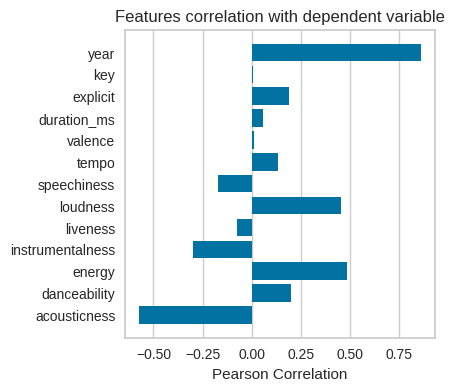

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [22]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(4,4)

# Fit the data to the visualizer
visualizer.fit(X, y)
visualizer.show()

# **Data Understanding by Visualization and EDA**

**Music Over Time**

<Axes: xlabel='count', ylabel='decade'>

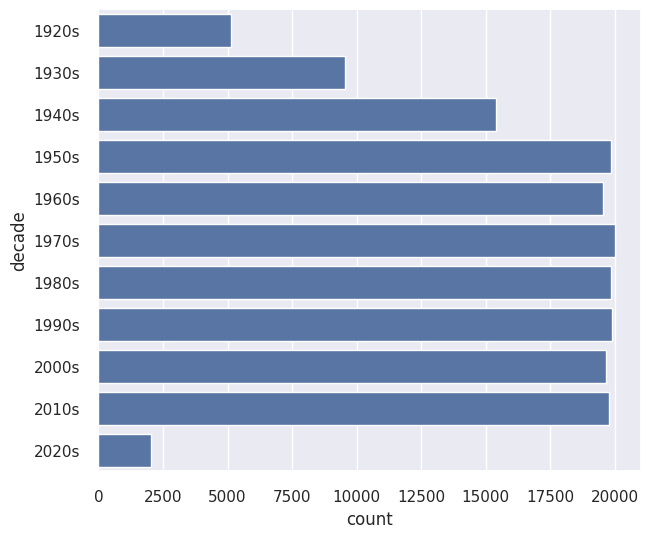

In [23]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(7 ,6)})
sns.countplot(data['decade'])

In [24]:
#plot the sound features over the years
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

# **Characteristics of Different Genres**

In [25]:
# #plot the top 10 genres based on popularity
# top10_genres = genre_data.nlargest(10, 'popularity')

# fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
# fig.show()

In [26]:
#plot the top 10 genres based on popularity
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['danceability', 'acousticness'], barmode='group')
fig.show()

# **Clustering Genres with K-Means**

In [28]:
from sklearn.cluster import KMeans
X_Genres = genre_data.select_dtypes(np.number)
#Find optimum number of cluster
sse = [] #SUM OF SQUARED ERROR
for k in range(1,11):
    km = KMeans(n_clusters=k)
    km.fit(X_Genres)
    sse.append(km.inertia_)

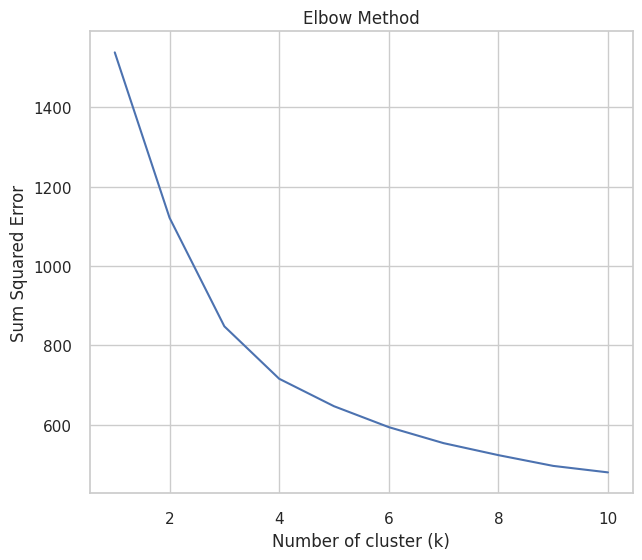

In [29]:

sns.set_style("whitegrid")
g=sns.lineplot(x=range(1,11), y=sse)

g.set(xlabel ="Number of cluster (k)",
      ylabel = "Sum Squared Error",
      title ='Elbow Method')

plt.show()

In [30]:
#The simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters
#based on the numerical audio features of each genres.
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
# Set a random seed for reproducibility
random_seed = 42

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10,random_state=random_seed))])
# cluster_pipeline = KMeans(n_clusters=3)
X_Genres = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X_Genres)
genre_data['cluster'] = cluster_pipeline.predict(X_Genres)

In [31]:
# Visualizing the Clusters with t-SNE
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2,random_state=random_seed, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X_Genres)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.239s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.692032
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.196312
[t-SNE] KL divergence after 1000 iterations: 1.403833


# **Clustering Songs with K-Means**

In [33]:
X_Songs = data.select_dtypes(np.number)
#Find optimum number of cluster
sse = [] #SUM OF SQUARED ERROR
for k in range(1,11):
    km = KMeans(n_clusters=k)
    km.fit(X_Songs)
    sse.append(km.inertia_)

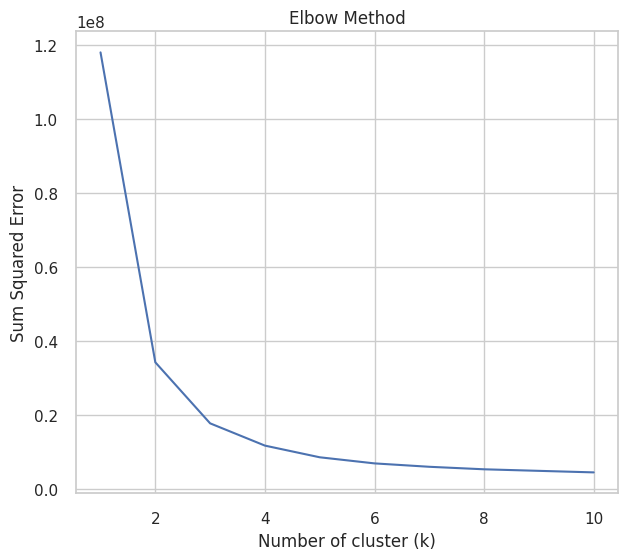

In [34]:
sns.set_style("whitegrid")
g=sns.lineplot(x=range(1,11), y=sse)

g.set(xlabel ="Number of cluster (k)",
      ylabel = "Sum Squared Error",
      title ='Elbow Method')

plt.show()

In [35]:
# Set a random seed for reproducibility
random_seed = 42

#Clustering Songs with K-Means
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=3,
                                                    random_state=random_seed,
                                   verbose=False))
                                 ], verbose=False)
# song_cluster_pipeline = KMeans(n_clusters=3)

X_Songs = data.select_dtypes(np.number)
number_cols = list(X_Songs.columns)
song_cluster_pipeline.fit(X_Songs)
song_cluster_labels = song_cluster_pipeline.predict(X_Songs)
data['cluster_label'] = song_cluster_labels


In [36]:
# Visualizing the song clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2,random_state=random_seed))])
song_embedding = pca_pipeline.fit_transform(X_Songs)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [37]:
from sklearn.metrics import silhouette_score

# Calculate Silhouette Score for genre clustering
score = silhouette_score(X_Genres, genre_data['cluster'])
print('Silhouette Score for genre clustering: ', score)

# Calculate Silhouette Score for song clustering
score = silhouette_score(X_Songs, data['cluster_label'])
print('Silhouette Score for song clustering: ', score)


Silhouette Score for genre clustering:  0.18487550922967033
Silhouette Score for song clustering:  0.18335963817398057


In [38]:
from sklearn.metrics import davies_bouldin_score

# Calculate Davies-Bouldin Index for genre clustering
dbi = davies_bouldin_score(X_Genres, genre_data['cluster'])
print('Davies-Bouldin Index for genre clustering: ', dbi)

# Calculate Davies-Bouldin Index for song clustering
dbi = davies_bouldin_score(X_Songs, data['cluster_label'])
print('Davies-Bouldin Index for song clustering: ', dbi)


Davies-Bouldin Index for genre clustering:  2.011224002940975
Davies-Bouldin Index for song clustering:  5.106341954251074


# **Function that recommends songs based on the clusters created**

In [39]:
def recommend_songs(song_name, data, n=10):
    # Check if the song exists
    if not data['name'].str.contains(song_name).any():
        raise ValueError(f"Song '{song_name}' not found in data.")

    # Find the cluster of the song
    song_cluster = data.loc[data['name'] == song_name, 'cluster_label'].values[0]

    # Get songs in the same cluster sorted by popularity
    cluster_songs = data[data['cluster_label'] == song_cluster].sort_values(by='popularity', ascending=False)

    # Remove the song itself from the recommendation list
    cluster_songs = cluster_songs[cluster_songs['name'] != song_name]

    # Return the top n songs
    return cluster_songs['name'].head(n)

In [45]:
def recommend_songs(song_name, data, n=10):
    # Check if the song exists
    if not data['name'].str.contains(song_name).any():
        raise ValueError(f"Song '{song_name}' not found in data.")

    # Find the cluster of the song
    song_cluster = data.loc[data['name'] == song_name, 'cluster_label'].values[0]

    # Get songs in the same cluster sorted by popularity
    cluster_songs = data[data['cluster_label'] == song_cluster].sort_values(by='popularity', ascending=False)

    # Remove the song itself from the recommendation list
    cluster_songs = cluster_songs[cluster_songs['name'] != song_name]

    # Return the top n songs along with the year and artist name
    return cluster_songs[['name', 'artists', 'year']].head(n)


In [46]:
data['name'].head(10)

0    Piano Concerto No. 3 in D Minor, Op. 30: III. ...
1                              Clancy Lowered the Boom
2                                            Gati Bali
3                                            Danny Boy
4                          When Irish Eyes Are Smiling
5                                         Gati Mardika
6                             The Wearing of the Green
7    Morceaux de fantaisie, Op. 3: No. 2, Prélude i...
8                          La Mañanita - Remasterizado
9                                    Il Etait Syndiqué
Name: name, dtype: object

# **Test the Function**

In [47]:
print(recommend_songs('Gati Bali', data))

                                            name  \
19433                      when the party's over   
19030  Clean White Noise - Loopable with no fade   
19461                                 i love you   
7406      Let It Snow! Let It Snow! Let It Snow!   
19260                           Soft Brown Noise   
10606                                  Landslide   
19038                       White Noise - 500 hz   
19540                         listen before i go   
19504                                 Bubble Gum   
9811                   Imagine - Remastered 2010   

                                                 artists  year  
19433                                  ['Billie Eilish']  2019  
19030  ['Erik Eriksson', 'White Noise Baby Sleep', 'W...  2017  
19461                                  ['Billie Eilish']  2019  
7406                                     ['Dean Martin']  1959  
19260                          ['High Altitude Samples']  2018  
10606                                

In [48]:
print(recommend_songs('China', data))

                                 name  \
19618                        Dynamite   
19616                 Blinding Lights   
19623              you broke me first   
19615  Holy (feat. Chance The Rapper)   
19407                Watermelon Sugar   
19655       Head & Heart (feat. MNEK)   
19720                Relación - Remix   
19621             Put Your Records On   
19619                         Heather   
19624                  Therefore I Am   

                                                 artists  year  
19618                                            ['BTS']  2020  
19616                                     ['The Weeknd']  2020  
19623                                     ['Tate McRae']  2020  
19615             ['Justin Bieber', 'Chance the Rapper']  2020  
19407                                   ['Harry Styles']  2019  
19655                             ['Joel Corry', 'MNEK']  2020  
19720  ['Sech', 'Daddy Yankee', 'J Balvin', 'ROSALÍA'...  2020  
19621                       

In [49]:
print(recommend_songs('Clancy Lowered the Boom', data))

                                            name  \
19433                      when the party's over   
19030  Clean White Noise - Loopable with no fade   
19461                                 i love you   
7406      Let It Snow! Let It Snow! Let It Snow!   
19260                           Soft Brown Noise   
10606                                  Landslide   
19038                       White Noise - 500 hz   
19540                         listen before i go   
19504                                 Bubble Gum   
9811                   Imagine - Remastered 2010   

                                                 artists  year  
19433                                  ['Billie Eilish']  2019  
19030  ['Erik Eriksson', 'White Noise Baby Sleep', 'W...  2017  
19461                                  ['Billie Eilish']  2019  
7406                                     ['Dean Martin']  1959  
19260                          ['High Altitude Samples']  2018  
10606                                